In [13]:
pip install xarray


Note: you may need to restart the kernel to use updated packages.


In [14]:
pip install cufflinks


Note: you may need to restart the kernel to use updated packages.


In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

import plotly
import plotly.express as px
import plotly.graph_objects as go
import cufflinks as cf


import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

In [16]:
df = pd.read_csv("2016_THUWAL_data_wide.csv", parse_dates=['date'], index_col='date')
df

,hour,lon,lat,dniuncer,ghiuncer,t2,wd3m,ws3m,swddhi,swddni,ghi,rh2,sfcpres,dhiuncer
date,,,,,,,,,,,,,,
2016-01-01,0,39.100,22.300,0.000,0.000,19.600,37.000,2.100,0.000,0.000,0.000,69.600,1013.200,0.000
2016-01-01,1,39.100,22.300,0.000,0.000,18.900,39.000,1.700,0.000,0.000,0.000,69.600,1013.000,0.000
2016-01-01,2,39.100,22.300,0.000,0.000,18.600,45.000,1.500,0.000,0.000,0.000,70.300,1013.000,0.000
2016-01-01,3,39.100,22.300,0.000,0.000,18.500,37.000,2.100,0.000,0.000,0.000,69.000,1012.700,0.000
2016-01-01,4,39.100,22.300,0.000,0.000,18.000,55.000,1.900,0.000,0.000,0.000,69.600,1012.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31,19,39.100,22.300,0.000,0.000,24.000,313.000,2.300,0.000,0.000,0.000,80.100,1013.900,0.000
2016-12-31,20,39.100,22.300,0.000,0.000,23.900,316.000,2.300,0.000,0.000,0.000,81.700,1014.200,0.000
2016-12-31,21,39.100,22.300,0.000,0.000,23.900,321.000,2.000,0.000,0.000,0.000,83.300,1014.600,0.000


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8784 entries, 2016-01-01 to 2016-12-31
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   hour      8784 non-null   int64  
 1   lon       8784 non-null   float64
 2   lat       8784 non-null   float64
 3   dniuncer  8784 non-null   float64
 4   ghiuncer  8784 non-null   float64
 5   t2        8784 non-null   float64
 6   wd3m      8784 non-null   float64
 7   ws3m      8784 non-null   float64
 8   swddhi    8784 non-null   float64
 9   swddni    8784 non-null   float64
 10  ghi       8784 non-null   float64
 11  rh2       8784 non-null   float64
 12  sfcpres   8784 non-null   float64
 13  dhiuncer  8784 non-null   float64
dtypes: float64(13), int64(1)
memory usage: 1.0 MB


In [18]:
df.describe().T


,count,mean,std,min,25%,50%,75%,max
hour,8784.000,11.500,6.923,0.000,5.750,11.500,17.250,23.000
lon,8784.000,39.100,0.000,39.100,39.100,39.100,39.100,39.100
lat,8784.000,22.300,0.000,22.300,22.300,22.300,22.300,22.300
dniuncer,8784.000,15.222,19.084,0.000,0.000,0.000,32.400,158.600
ghiuncer,8784.000,16.943,21.064,0.000,0.000,2.900,35.900,173.600
t2,8784.000,28.626,3.990,14.000,25.875,29.200,31.700,41.200
wd3m,8784.000,202.401,122.368,0.000,61.000,270.000,300.000,359.000
ws3m,8784.000,2.541,1.303,0.000,1.500,2.400,3.400,10.600
swddhi,8784.000,95.709,121.444,0.000,0.000,13.500,182.900,621.300
swddni,8784.000,218.745,287.703,0.000,0.000,0.200,488.800,1005.700


In [19]:
# creating new features for EDA

df["year"] = df.index.year
df['month'] = df.index.month 
df['day'] = df.index.day
df['dayofweek'] = df.index.dayofweek
df["date"] = df.index.date

df.head()


,hour,lon,lat,dniuncer,ghiuncer,t2,wd3m,ws3m,swddhi,swddni,ghi,rh2,sfcpres,dhiuncer,year,month,day,dayofweek,date
date,,,,,,,,,,,,,,,,,,,
2016-01-01,0,39.100,22.300,0.000,0.000,19.600,37.000,2.100,0.000,0.000,0.000,69.600,1013.200,0.000,2016,1,1,4,2016-01-01
2016-01-01,1,39.100,22.300,0.000,0.000,18.900,39.000,1.700,0.000,0.000,0.000,69.600,1013.000,0.000,2016,1,1,4,2016-01-01
2016-01-01,2,39.100,22.300,0.000,0.000,18.600,45.000,1.500,0.000,0.000,0.000,70.300,1013.000,0.000,2016,1,1,4,2016-01-01
2016-01-01,3,39.100,22.300,0.000,0.000,18.500,37.000,2.100,0.000,0.000,0.000,69.000,1012.700,0.000,2016,1,1,4,2016-01-01
2016-01-01,4,39.100,22.300,0.000,0.000,18.000,55.000,1.900,0.000,0.000,0.000,69.600,1012.500,0.000,2016,1,1,4,2016-01-01


In [20]:
df.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8784 entries, 2016-01-01 to 2016-12-31
Data columns (total 19 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   hour       8784 non-null   int64  
 1   lon        8784 non-null   float64
 2   lat        8784 non-null   float64
 3   dniuncer   8784 non-null   float64
 4   ghiuncer   8784 non-null   float64
 5   t2         8784 non-null   float64
 6   wd3m       8784 non-null   float64
 7   ws3m       8784 non-null   float64
 8   swddhi     8784 non-null   float64
 9   swddni     8784 non-null   float64
 10  ghi        8784 non-null   float64
 11  rh2        8784 non-null   float64
 12  sfcpres    8784 non-null   float64
 13  dhiuncer   8784 non-null   float64
 14  year       8784 non-null   int32  
 15  month      8784 non-null   int32  
 16  day        8784 non-null   int32  
 17  dayofweek  8784 non-null   int32  
 18  date       8784 non-null   object 
dtypes: float64(13), int32(4), int6

In [21]:
import plotly.io as pio

# Get the 'xgridoff' template
xgridoff_template = pio.templates['xgridoff']

# Customize the template for dark mode
xgridoff_template.layout.paper_bgcolor = 'rgb(25, 25, 25)'  # very dark gray background
xgridoff_template.layout.plot_bgcolor = 'rgb(35, 35, 35)'   # dark gray plot background
xgridoff_template.layout.font.color = 'lightgray'           # light gray font color

# Adjust gridline color and width
xgridoff_template.layout.xaxis.gridcolor = 'rgba(200, 200, 200, 0.3)'  # light gray with transparency
xgridoff_template.layout.yaxis.gridcolor = 'rgba(200, 200, 200, 0.3)'  # light gray with transparency
xgridoff_template.layout.xaxis.gridwidth = 1
xgridoff_template.layout.yaxis.gridwidth = 1

# Update Plotly templates with the modified 'xgridoff' template
pio.templates['xgridoff_dark'] = xgridoff_template

# Optional: Check if the new template is added
print('xgridoff_dark' in pio.templates)


True


In [22]:
alpha = 0.14  # typical value for neutral stability
df['ws2m'] = df['ws3m'] * (2 / 3) ** alpha
df


,hour,lon,lat,dniuncer,ghiuncer,t2,wd3m,ws3m,swddhi,swddni,ghi,rh2,sfcpres,dhiuncer,year,month,day,dayofweek,date,ws2m
date,,,,,,,,,,,,,,,,,,,,
2016-01-01,0,39.100,22.300,0.000,0.000,19.600,37.000,2.100,0.000,0.000,0.000,69.600,1013.200,0.000,2016,1,1,4,2016-01-01,1.984
2016-01-01,1,39.100,22.300,0.000,0.000,18.900,39.000,1.700,0.000,0.000,0.000,69.600,1013.000,0.000,2016,1,1,4,2016-01-01,1.606
2016-01-01,2,39.100,22.300,0.000,0.000,18.600,45.000,1.500,0.000,0.000,0.000,70.300,1013.000,0.000,2016,1,1,4,2016-01-01,1.417
2016-01-01,3,39.100,22.300,0.000,0.000,18.500,37.000,2.100,0.000,0.000,0.000,69.000,1012.700,0.000,2016,1,1,4,2016-01-01,1.984
2016-01-01,4,39.100,22.300,0.000,0.000,18.000,55.000,1.900,0.000,0.000,0.000,69.600,1012.500,0.000,2016,1,1,4,2016-01-01,1.795
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-31,19,39.100,22.300,0.000,0.000,24.000,313.000,2.300,0.000,0.000,0.000,80.100,1013.900,0.000,2016,12,31,5,2016-12-31,2.173
2016-12-31,20,39.100,22.300,0.000,0.000,23.900,316.000,2.300,0.000,0.000,0.000,81.700,1014.200,0.000,2016,12,31,5,2016-12-31,2.173
2016-12-31,21,39.100,22.300,0.000,0.000,23.900,321.000,2.000,0.000,0.000,0.000,83.300,1014.600,0.000,2016,12,31,5,2016-12-31,1.890


In [23]:
keep_cols = ['ws2m', 't2', 'rh2', 'sfcpres', 'wd3m', 'hour', 'day', 'month', 'dayofweek']
df = df[keep_cols]
df


,ws2m,t2,rh2,sfcpres,wd3m,hour,day,month,dayofweek
date,,,,,,,,,
2016-01-01,1.984,19.600,69.600,1013.200,37.000,0,1,1,4
2016-01-01,1.606,18.900,69.600,1013.000,39.000,1,1,1,4
2016-01-01,1.417,18.600,70.300,1013.000,45.000,2,1,1,4
2016-01-01,1.984,18.500,69.000,1012.700,37.000,3,1,1,4
2016-01-01,1.795,18.000,69.600,1012.500,55.000,4,1,1,4
...,...,...,...,...,...,...,...,...,...
2016-12-31,2.173,24.000,80.100,1013.900,313.000,19,31,12,5
2016-12-31,2.173,23.900,81.700,1014.200,316.000,20,31,12,5
2016-12-31,1.890,23.900,83.300,1014.600,321.000,21,31,12,5


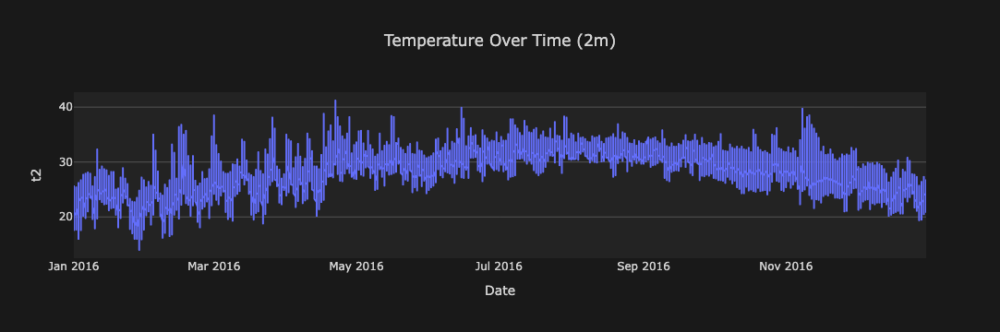

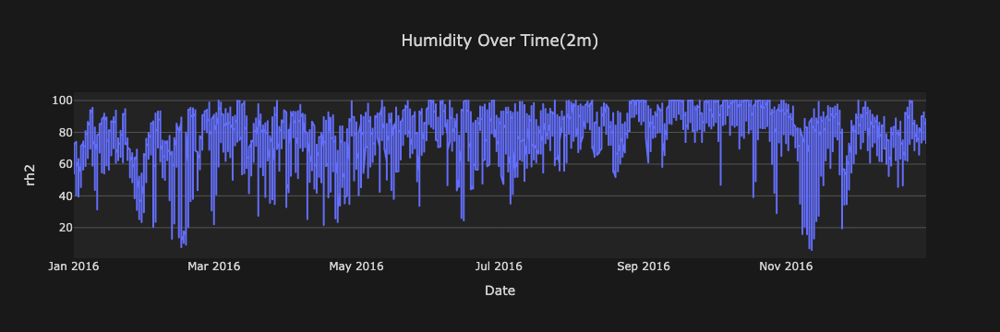

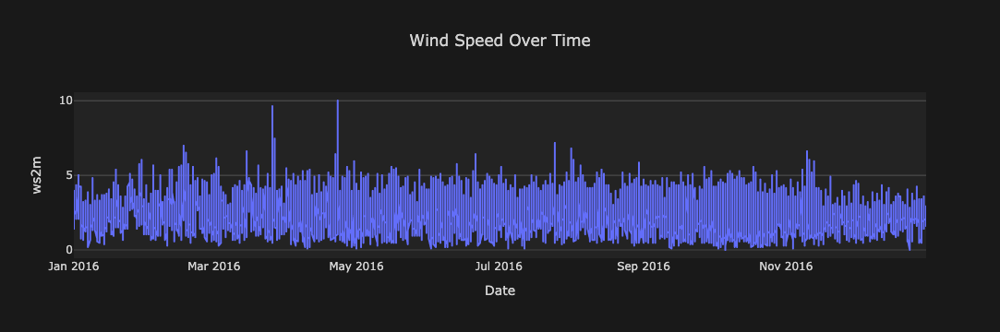

ValueError: Value of 'y' is not the name of a column in 'data_frame'. Expected one of ['t2', 'rh2', 'ws2m', 'wd3m'] but received: sfcpres

In [252]:
fig_meantemp = px.line(df, x=df.index, y='t2', title='Temperature Over Time (2m)')
fig_meantemp.update_layout(template='xgridoff_dark', title_x=0.5, xaxis_title="Date")
fig_meantemp.show()

fig_humidity = px.line(df, x=df.index, y='rh2', title='Humidity Over Time(2m)')
fig_humidity.update_layout(template='xgridoff_dark', title_x=0.5, xaxis_title="Date")
fig_humidity.show()

fig_wind_speed = px.line(df, x=df.index, y='ws2m', title='Wind Speed Over Time')
fig_wind_speed.update_layout(template='xgridoff_dark', title_x=0.5, xaxis_title="Date")
fig_wind_speed.show()

fig_meanpressure = px.line(df, x=df.index, y='sfcpres', title='Mean Pressure Over Time')
fig_meanpressure.update_layout(template='xgridoff_dark', title_x=0.5, xaxis_title="Date")
fig_meanpressure.show()

In [25]:
from statsmodels.tsa.seasonal import seasonal_decompose
import plotly.subplots as sp

# Perform seasonal decomposition
result = seasonal_decompose(df['ws2m'], model='additive', period=365)

# Plot the decomposed components
fig = sp.make_subplots(rows=4, cols=1, shared_xaxes=True, 
                       subplot_titles=['Observed', 'Trend', 'Seasonal', 'Residual'])

fig.add_trace(go.Scatter(x=df.index, y=result.observed, mode='lines', name='Observed'), row=1, col=1)
fig.add_trace(go.Scatter(x=df.index, y=result.trend, mode='lines', name='Trend'), row=2, col=1)
fig.add_trace(go.Scatter(x=df.index, y=result.seasonal, mode='lines', name='Seasonal'), row=3, col=1)
fig.add_trace(go.Scatter(x=df.index, y=result.resid, mode='lines', name='Residual'), row=4, col=1)

fig.update_layout(template= 'xgridoff_dark',height=800, title='Seasonal Decomposition of Wind Speed')
fig.show()

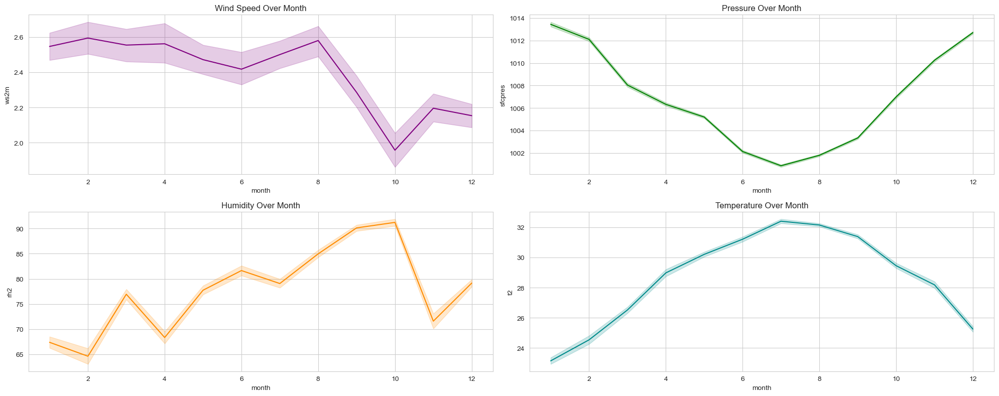

In [26]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 8))

sns.set_style('darkgrid')

# Plot each parameter against the 'month'
sns.lineplot(x='month', y='ws2m', data=df, color='purple', ax=axes[0][0])
axes[0][0].set_title('Wind Speed Over Month')

sns.lineplot(x='month', y='rh2', data=df, color='darkorange', ax=axes[1][0])
axes[1][0].set_title('Humidity Over Month')

sns.lineplot(x='month', y='sfcpres', data=df, color='green', ax=axes[0][1])
axes[0][1].set_title('Pressure Over Month')

sns.lineplot(x='month', y='t2', data=df, color='darkcyan', ax=axes[1][1])
axes[1][1].set_title('Temperature Over Month')

plt.tight_layout()
plt.show()

In [27]:
df


,ws2m,t2,rh2,sfcpres,wd3m,hour,day,month,dayofweek
date,,,,,,,,,
2016-01-01,1.984,19.600,69.600,1013.200,37.000,0,1,1,4
2016-01-01,1.606,18.900,69.600,1013.000,39.000,1,1,1,4
2016-01-01,1.417,18.600,70.300,1013.000,45.000,2,1,1,4
2016-01-01,1.984,18.500,69.000,1012.700,37.000,3,1,1,4
2016-01-01,1.795,18.000,69.600,1012.500,55.000,4,1,1,4
...,...,...,...,...,...,...,...,...,...
2016-12-31,2.173,24.000,80.100,1013.900,313.000,19,31,12,5
2016-12-31,2.173,23.900,81.700,1014.200,316.000,20,31,12,5
2016-12-31,1.890,23.900,83.300,1014.600,321.000,21,31,12,5


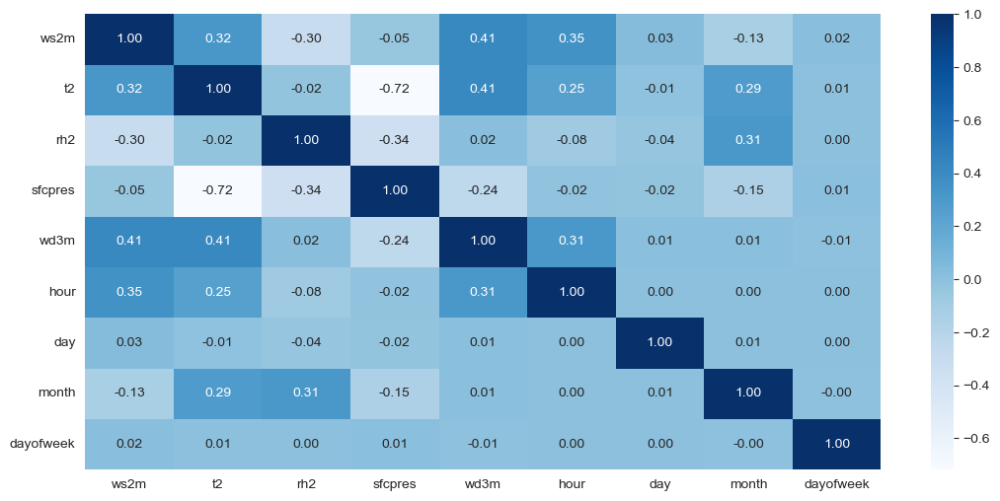

In [28]:
plt.figure(figsize=(13, 6))

sns.heatmap(df.select_dtypes('number').corr(), cmap='Blues', annot=True, fmt='.2f');


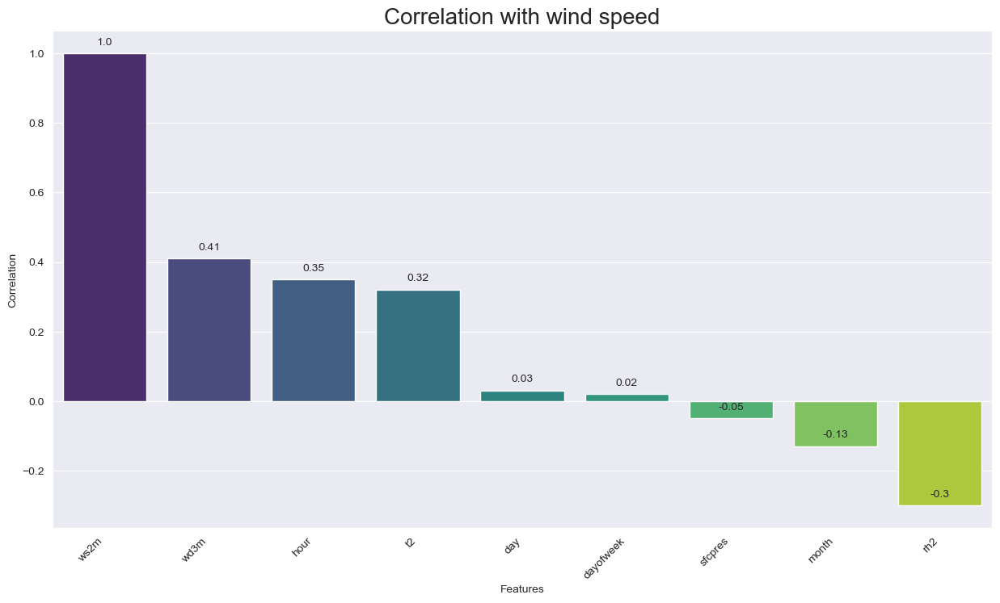

In [29]:
plt.figure(figsize=(15, 8))
sns.set_style('darkgrid')

correlation_matrix = round(df.select_dtypes('number').corr(), 2)

correlation_with_trgt = correlation_matrix['ws2m'].sort_values(ascending=False)

ax = sns.barplot(x=correlation_with_trgt.index, y=correlation_with_trgt, palette='viridis')

plt.title('Correlation with wind speed', size= 20)
plt.xlabel('Features')
plt.ylabel('Correlation')

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.xticks(rotation=45, ha='right')
plt.show()

In [30]:
# Box plots by Month

fig = px.box(df, x='month', y='t2', title='Monthly Distribution of  Temperatures', template='xgridoff_dark')
fig.show()

fig = px.box(df, x='month', y='rh2', title='Monthly Distribution of  Humidity', template='xgridoff_dark')
fig.show()

fig = px.box(df, x='month', y='ws2m', title='Monthly Distribution of  wind_speed', template='xgridoff_dark')
fig.show()

fig = px.box(df, x='month', y='sfcpres', title='Monthly Distribution of Pressure', template='xgridoff_dark')
fig.show()

In [254]:
# Increase the size of the figure
fig = px.scatter_matrix(df, 
                        dimensions=['t2', 'rh2', 'ws2m', 'sfcpres'], 
                        title='Scatter Matrix of Weather Parameters')

# Update layout to increase figure size and add outlines to dots
fig.update_layout(
    width=1200,  # Width of the figure
    height=800,  # Height of the figure
    title_x=0.5,  # Title position
    margin=dict(l=50, r=50, t=50, b=50),  # Margin around the plot
    template='xgridoff_dark'
)

# Update marker properties to add outlines
fig.update_traces(marker=dict(line=dict(width=1, color='black')))  # Add outlines to dots

# Show the figure
fig.show()

ValueError: Value of 'dimensions_3' is not the name of a column in 'data_frame'. Expected one of ['t2', 'rh2', 'ws2m', 'wd3m'] but received: sfcpres

In [256]:
df = df[['t2', 'rh2', 'ws2m', 'wd3m']]
df.head()

,t2,rh2,ws2m,wd3m
date,,,,
2016-01-01,19.600,69.600,1.984,37.000
2016-01-01,18.900,69.600,1.606,39.000
2016-01-01,18.600,70.300,1.417,45.000
2016-01-01,18.500,69.000,1.984,37.000
2016-01-01,18.000,69.600,1.795,55.000


In [33]:
df

,t2,rh2,ws2m,wd3m
date,,,,
2016-01-01,19.600,69.600,1.984,37.000
2016-01-01,18.900,69.600,1.606,39.000
2016-01-01,18.600,70.300,1.417,45.000
2016-01-01,18.500,69.000,1.984,37.000
2016-01-01,18.000,69.600,1.795,55.000
...,...,...,...,...
2016-12-31,24.000,80.100,2.173,313.000
2016-12-31,23.900,81.700,2.173,316.000
2016-12-31,23.900,83.300,1.890,321.000


In [34]:
df.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8784 entries, 2016-01-01 to 2016-12-31
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   t2      8784 non-null   float64
 1   rh2     8784 non-null   float64
 2   ws2m    8784 non-null   float64
 3   wd3m    8784 non-null   float64
dtypes: float64(4)
memory usage: 343.1 KB


In [35]:
## Moving averages

In [36]:
df1 = df.copy()
df1

,t2,rh2,ws2m,wd3m
date,,,,
2016-01-01,19.600,69.600,1.984,37.000
2016-01-01,18.900,69.600,1.606,39.000
2016-01-01,18.600,70.300,1.417,45.000
2016-01-01,18.500,69.000,1.984,37.000
2016-01-01,18.000,69.600,1.795,55.000
...,...,...,...,...
2016-12-31,24.000,80.100,2.173,313.000
2016-12-31,23.900,81.700,2.173,316.000
2016-12-31,23.900,83.300,1.890,321.000


In [37]:
print(df.describe())

            t2      rh2     ws2m     wd3m
count 8784.000 8784.000 8784.000 8784.000
mean    28.626   77.807    2.401  202.401
std      3.990   16.283    1.231  122.368
min     14.000    6.000    0.000    0.000
25%     25.875   69.700    1.417   61.000
50%     29.200   80.900    2.268  270.000
75%     31.700   89.400    3.212  300.000
max     41.200  100.000   10.015  359.000


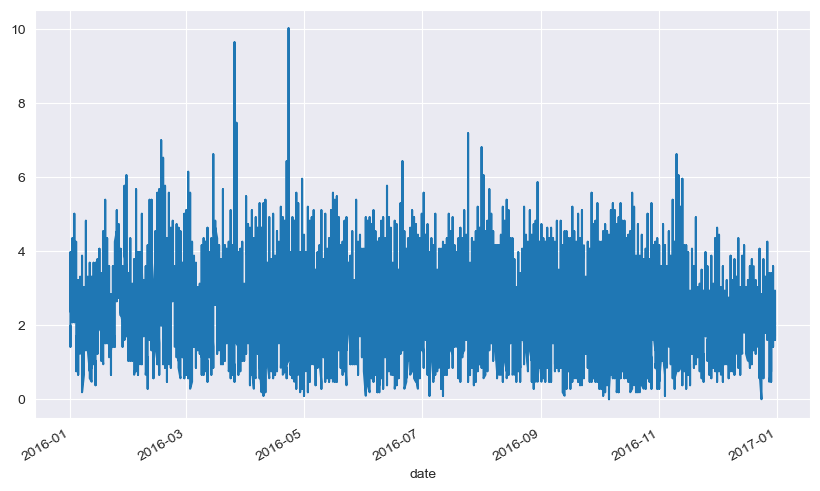

In [38]:
from matplotlib import pyplot
df['ws2m'].plot()
pyplot.show()

<Axes: >

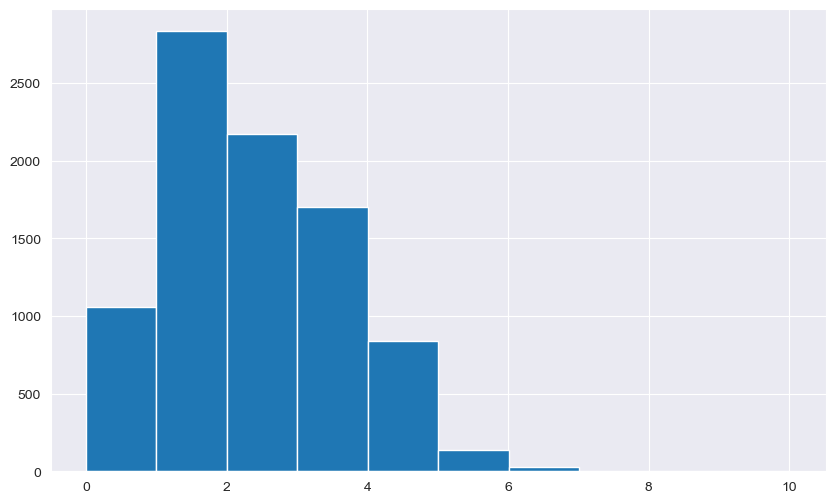

In [39]:
df['ws2m'].hist()

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

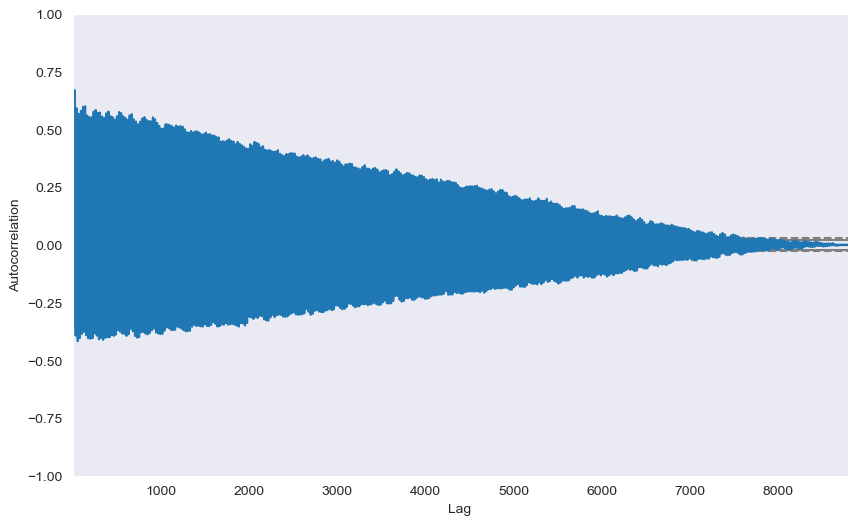

In [40]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(df['ws2m'])

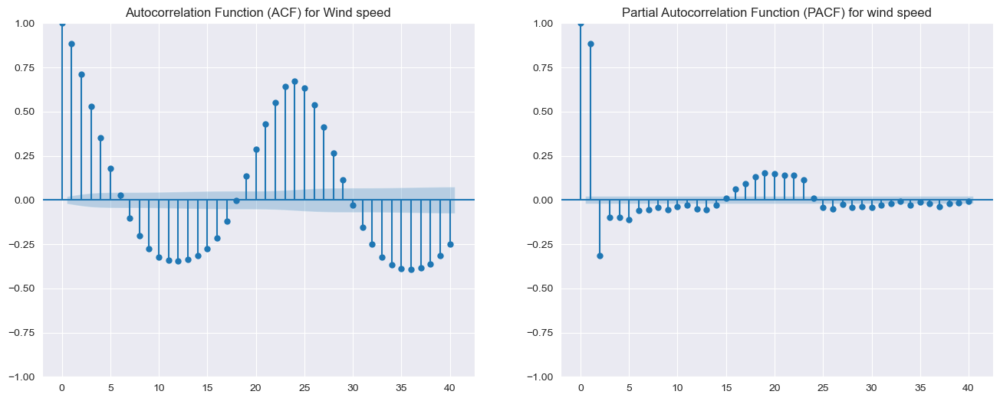

In [41]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot ACF
plot_acf(df1['ws2m'], ax=axes[0], lags=40, title='Autocorrelation Function (ACF) for Wind speed')

# Plot PACF
plot_pacf(df1['ws2m'], ax=axes[1], lags=40, title='Partial Autocorrelation Function (PACF) for wind speed')

plt.show()

In [42]:
## Augmented Dickey-Fuller test\
## Augmented Dickey-Fuller Test (ADF)

# Null Hypothesis H0: The series is not stationary
# Alternative Hypothesis H1: The series is stationary


In [43]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss

def check_stationarity(series):
    print(f'\n___________________  Checking Stationarity for: {series.name}  ___________________\n')
    
    # ADF Test
    adf_test = adfuller(series.values)
    print('ADF Test:\n')
    print('ADF Statistic: %f' % adf_test[0])
    print('p-value: %f' % adf_test[1])
    print('Critical Values:')
    for key, value in adf_test[4].items():
        print('\t%s: %.3f' % (key, value))

    if (adf_test[1] <= 0.05) & (adf_test[4]['5%'] > adf_test[0]):
        print("\u001b[32mSeries is Stationary (ADF Test)\u001b[0m")
    else:
        print("\x1b[31mSeries is Non-stationary (ADF Test)\x1b[0m")
    
    print('\n' + '-'*50 + '\n')

In [44]:
# Check initial stationarity for each feature

check_stationarity(df1['t2'])  # target is non stationary!!
check_stationarity(df1['rh2'])
check_stationarity(df1['ws2m'])
check_stationarity(df1['wd3m'])


___________________  Checking Stationarity for: t2  ___________________

ADF Test:

ADF Statistic: -4.329021
p-value: 0.000396
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Series is Stationary (ADF Test)

--------------------------------------------------


___________________  Checking Stationarity for: rh2  ___________________

ADF Test:

ADF Statistic: -8.002207
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Series is Stationary (ADF Test)

--------------------------------------------------


___________________  Checking Stationarity for: ws2m  ___________________

ADF Test:

ADF Statistic: -12.467108
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Series is Stationary (ADF Test)

--------------------------------------------------


___________________  Checking Stationarity for: wd3m  ___________________

ADF Test:

ADF Statistic: -10.200650
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Series is 

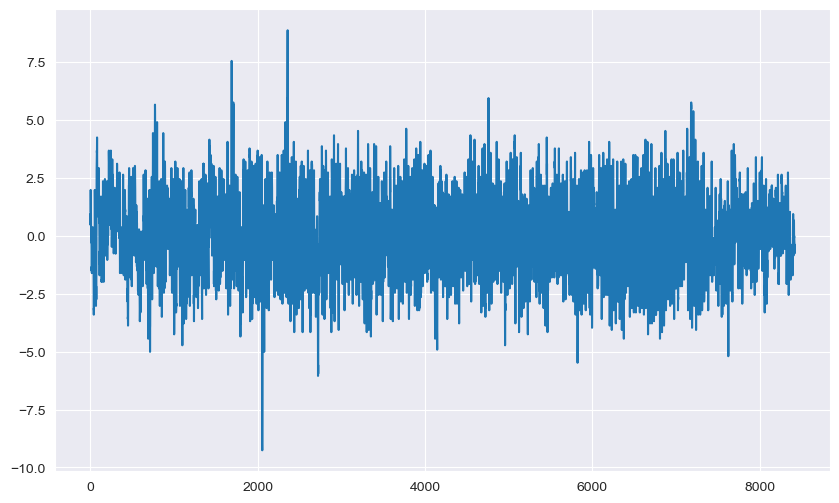

In [45]:
X = df['ws2m'].values
diff = list()
days_in_year = 365
for i in range(days_in_year, len(X)):
  value = X[i] - X[i - days_in_year]
  diff.append(value)
pyplot.plot(diff)
pyplot.show()

Coefficients: [-9.08405808e-11  6.36810789e-08 -1.22552745e-05  4.11264317e-04
  2.41814321e+00]


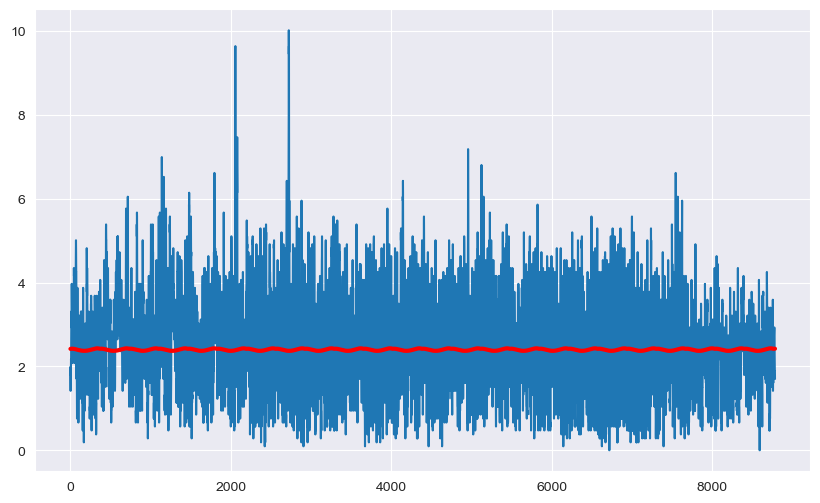

In [46]:
from matplotlib import pyplot
from numpy import polyfit
X = [i%365 for i in range(0, len(df['ws2m']))]
y = df['ws2m'].values
degree = 4
coef = polyfit(X, y, degree) 
print('Coefficients: %s' % coef)
# create curve
curve = list()
for i in range(len(X)):
  value = coef[-1]
  for d in range(degree):
    value += X[i]**(degree-d) * coef[d]
  curve.append(value)
# plot curve over original data
pyplot.plot(df['ws2m'].values) 
pyplot.plot(curve, color='red', linewidth=3) 
pyplot.show()



In [47]:
#learning train test split 

In [48]:
df2 = df.copy()
X = df2.values
train_size = int(len(X) * 0.66)
train, test = X[0:train_size], X[train_size:len(X)]
print('Observations: %d' % (len(X)))
print('Training Observations: %d' % (len(train)))
print('Testing Observations: %d' % (len(test)))

Observations: 8784
Training Observations: 5797
Testing Observations: 2987


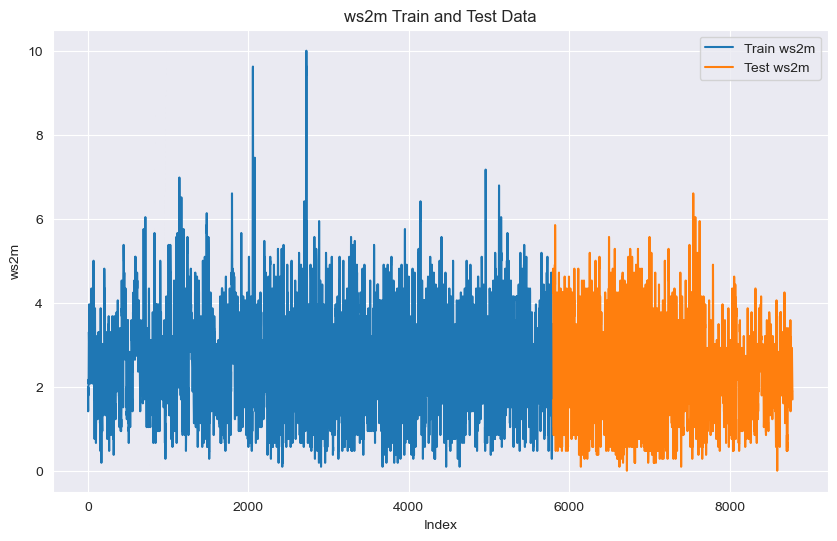

In [49]:
ws2m_index = df2.columns.get_loc('ws2m')
train_ws2m = train[:, ws2m_index]
test_ws2m = test[:, ws2m_index]
import numpy as np
import matplotlib.pyplot as plt

plt.plot(train_ws2m, label='Train ws2m')
plt.plot([np.nan for _ in train_ws2m] + [x for x in test_ws2m], label='Test ws2m')
plt.title('ws2m Train and Test Data')
plt.xlabel('Index')
plt.ylabel('ws2m')
plt.legend()
plt.show()



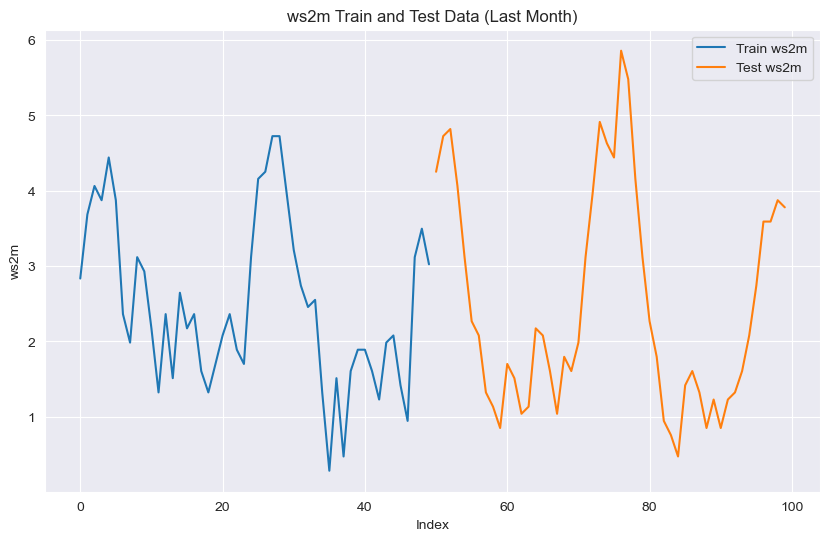

In [50]:
# Suppose your data is hourly, and you want 1 month (720 hours)df
window = 50  # or whatever fits your data's frequency

plt.plot(train_ws2m[-window:], label='Train ws2m')
plt.plot([np.nan for _ in train_ws2m[-window:]] + [x for x in test_ws2m[:window]], label='Test ws2m')
plt.title('ws2m Train and Test Data (Last Month)')
plt.xlabel('Index')
plt.ylabel('ws2m')
plt.legend()
plt.show()


In [51]:
df1

,t2,rh2,ws2m,wd3m
date,,,,
2016-01-01,19.600,69.600,1.984,37.000
2016-01-01,18.900,69.600,1.606,39.000
2016-01-01,18.600,70.300,1.417,45.000
2016-01-01,18.500,69.000,1.984,37.000
2016-01-01,18.000,69.600,1.795,55.000
...,...,...,...,...
2016-12-31,24.000,80.100,2.173,313.000
2016-12-31,23.900,81.700,2.173,316.000
2016-12-31,23.900,83.300,1.890,321.000


In [52]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8784 entries, 2016-01-01 to 2016-12-31
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   t2      8784 non-null   float64
 1   rh2     8784 non-null   float64
 2   ws2m    8784 non-null   float64
 3   wd3m    8784 non-null   float64
dtypes: float64(4)
memory usage: 343.1 KB


In [53]:
import pandas as pd

train_size = int(len(df1) * 0.8)
train, test = df1.iloc[:train_size], df1.iloc[train_size:]

In [54]:
display(f'Train shape: {train.shape}')
display(train.head())

display(f'Test shape: {test.shape}')
test.head()

'Train shape: (7027, 4)'

,t2,rh2,ws2m,wd3m
date,,,,
2016-01-01,19.600,69.600,1.984,37.000
2016-01-01,18.900,69.600,1.606,39.000
2016-01-01,18.600,70.300,1.417,45.000
2016-01-01,18.500,69.000,1.984,37.000
2016-01-01,18.000,69.600,1.795,55.000


'Test shape: (1757, 4)'

,t2,rh2,ws2m,wd3m
date,,,,
2016-10-19,29.800,92.600,2.457,304.000
2016-10-19,29.400,95.500,1.984,333.000
2016-10-19,29.100,97.100,1.984,357.000
2016-10-19,28.500,98.100,0.472,24.000
2016-10-19,28.300,99.000,0.378,230.000


Test MSE: 2.981


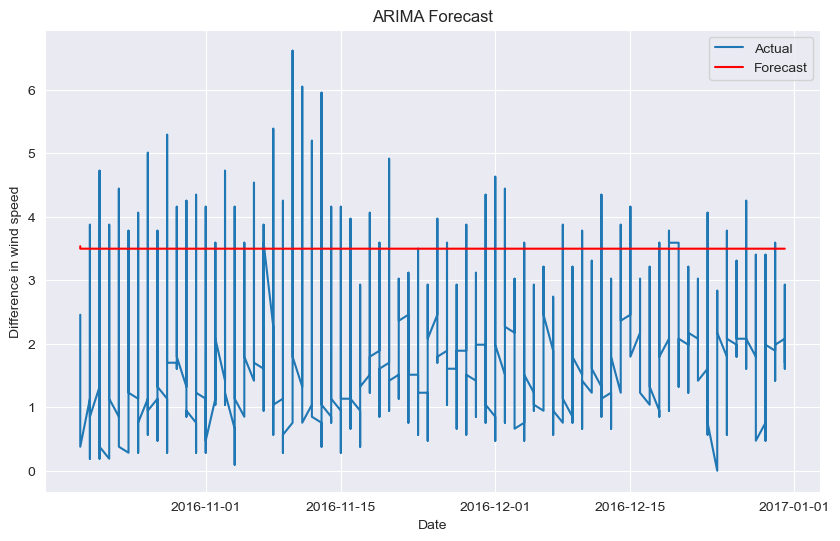

In [55]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error


# Fit the ARIMA model
arima_model = ARIMA(train['ws2m'], order=(1,1,1))  # ARIMA(p,d,q)
arima_model_fit = arima_model.fit()

# Make predictions
arima_pred = arima_model_fit.forecast(steps=len(test))

# Calculate error
error = mean_squared_error(test['ws2m'], arima_pred)
print('Test MSE: %.3f' % error)


plt.plot(test.index, test['ws2m'], label='Actual')
plt.plot(test.index, arima_pred, color='red', label='Forecast')
plt.xlabel('Date')
plt.ylabel('Difference in wind speed')
plt.title('ARIMA Forecast')
plt.legend()
plt.show()


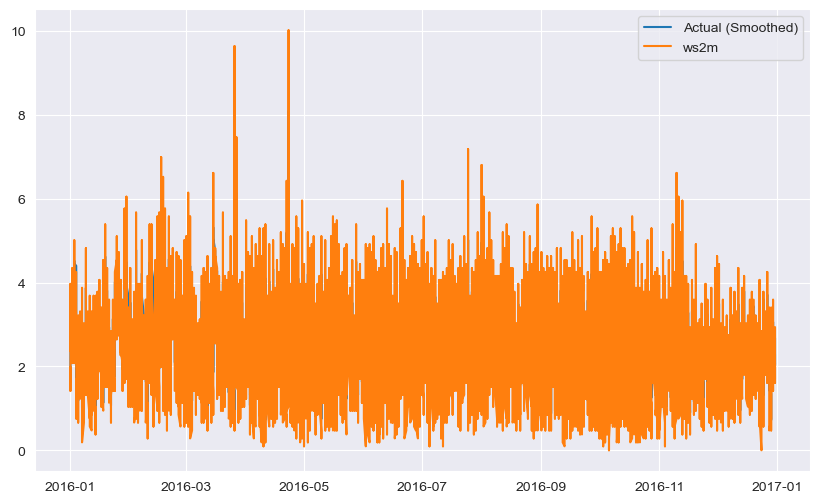

In [56]:
window_size = 7  # Try different values (e.g., 5, 7, 11) to see what looks best
df1['Actual_Smooth'] = df1['ws2m'].ewm(span=7).mean()  # No NaN values
plt.plot(df1.index, df1['Actual_Smooth'], label='Actual (Smoothed)')
plt.plot(df1.index, df1['ws2m'], label='ws2m')
plt.legend()
plt.show()



In [57]:
df1

,t2,rh2,ws2m,wd3m,Actual_Smooth
date,,,,,
2016-01-01,19.600,69.600,1.984,37.000,1.984
2016-01-01,18.900,69.600,1.606,39.000,1.768
2016-01-01,18.600,70.300,1.417,45.000,1.616
2016-01-01,18.500,69.000,1.984,37.000,1.751
2016-01-01,18.000,69.600,1.795,55.000,1.765
...,...,...,...,...,...
2016-12-31,24.000,80.100,2.173,313.000,2.492
2016-12-31,23.900,81.700,2.173,316.000,2.413
2016-12-31,23.900,83.300,1.890,321.000,2.282


In [58]:
import pandas as pd

# Combine actual and predicted into a DataFrame
df1_compare = pd.DataFrame({
    'Actual': test['ws2m'],
    'Forecast': arima_pred
}, index=test.index)


In [59]:
df1_compare

,Actual,Forecast
date,,
2016-10-19,2.457,NaN
2016-10-19,1.984,NaN
2016-10-19,1.984,NaN
2016-10-19,0.472,NaN
2016-10-19,0.378,NaN
...,...,...
2016-12-31,2.173,NaN
2016-12-31,2.173,NaN
2016-12-31,1.890,NaN


In [60]:
# Calculate daily median for both actual and forecast
daily_median = df1_compare.resample('D').median()



Test MSE: 0.387


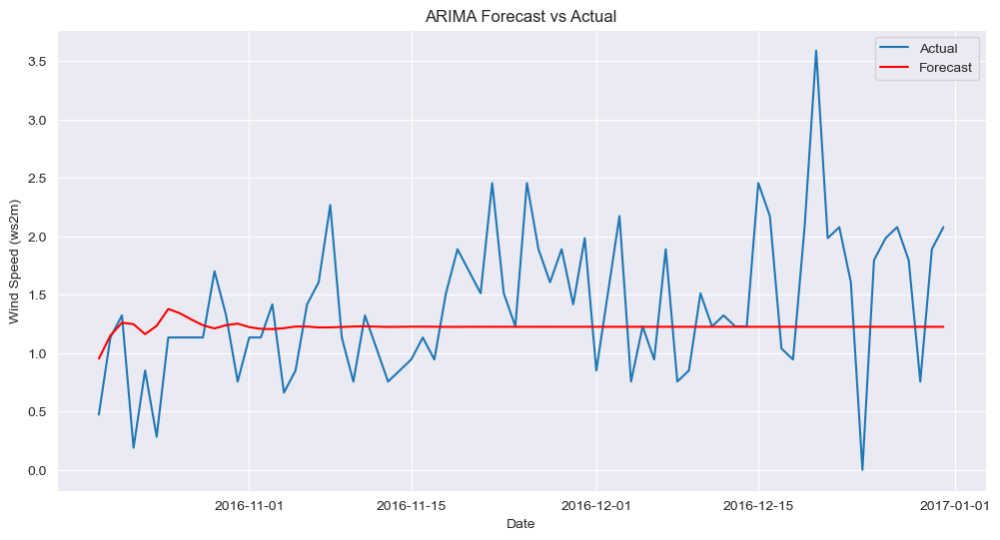

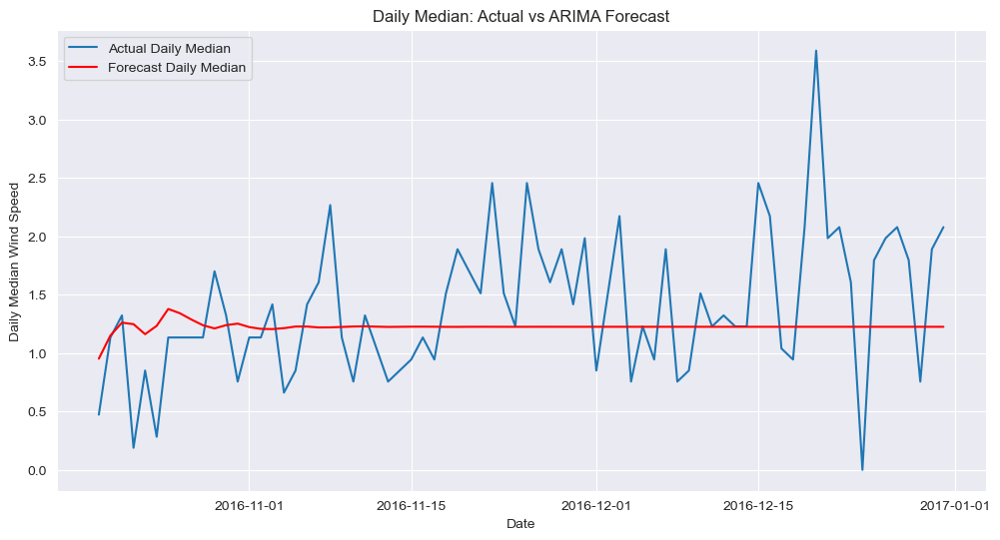

In [206]:
# Fit the ARIMA model
arima_model = ARIMA(train['ws2m'], order=(8,1,1))  # ARIMA(p,d,q)
arima_model_fit = arima_model.fit()

# Make predictions
arima_pred = arima_model_fit.forecast(steps=len(test))

# Create a Series with the predictions using test's datetime index
arima_pred_series = pd.Series(arima_pred.values, index=test.index)

# Create a DataFrame for combined analysis
combined_df = pd.DataFrame({
    'Actual': test['ws2m'],
    'Forecast': arima_pred_series
})

# Calculate error
error = mean_squared_error(test['ws2m'], arima_pred)
print('Test MSE: %.3f' % error)

# Plot the result
plt.figure(figsize=(12,6))
plt.plot(combined_df.index, combined_df['Actual'], label='Actual')
plt.plot(combined_df.index, combined_df['Forecast'], color='red', label='Forecast')
plt.xlabel('Date')
plt.ylabel('Wind Speed (ws2m)')
plt.title('ARIMA Forecast vs Actual')
plt.legend()
plt.show()

# For daily median as requested earlier
daily_median = combined_df.resample('D').median()

plt.figure(figsize=(12,6))
plt.plot(daily_median.index, daily_median['Actual'], label='Actual Daily Median')
plt.plot(daily_median.index, daily_median['Forecast'], label='Forecast Daily Median', color='red')
plt.xlabel('Date')
plt.ylabel('Daily Median Wind Speed')
plt.title('Daily Median: Actual vs ARIMA Forecast')
plt.legend()
plt.show()


In [62]:
!pip install pmdarima


In [63]:
import pmdarima as pm


In [118]:
train_scaled = train.copy()
test_scaled = test.copy()


In [120]:
train_scaled

,t2,rh2,ws2m,wd3m
date,,,,
2016-01-01,19.600,69.600,1.984,37.000
2016-01-01,18.900,69.600,1.606,39.000
2016-01-01,18.600,70.300,1.417,45.000
2016-01-01,18.500,69.000,1.984,37.000
2016-01-01,18.000,69.600,1.795,55.000
...,...,...,...,...
2016-10-19,32.900,70.800,4.252,279.000
2016-10-19,32.300,77.000,5.196,278.000
2016-10-19,31.600,83.600,4.630,281.000


In [144]:
# SARIMA model
#SARIMAX


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.06721D+00    |proj g|=  2.88300D-01

At iterate    5    f=  7.91251D-01    |proj g|=  5.81349D-02

At iterate   10    f=  7.54681D-01    |proj g|=  1.80854D-02

At iterate   15    f=  7.48619D-01    |proj g|=  3.82083D-03

At iterate   20    f=  7.48565D-01    |proj g|=  3.22239D-03

At iterate   25    f=  7.47955D-01    |proj g|=  3.19583D-02

At iterate   30    f=  7.44810D-01    |proj g|=  9.02588D-02

At iterate   35    f=  7.41781D-01    |proj g|=  2.11594D-03

At iterate   40    f=  7.41604D-01    |proj g|=  1.92012D-03

At iterate   45    f=  7.40167D-01    |proj g|=  2.38940D-02

At iterate   50    f=  7.39421D-01    |proj g|=  6.50589D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

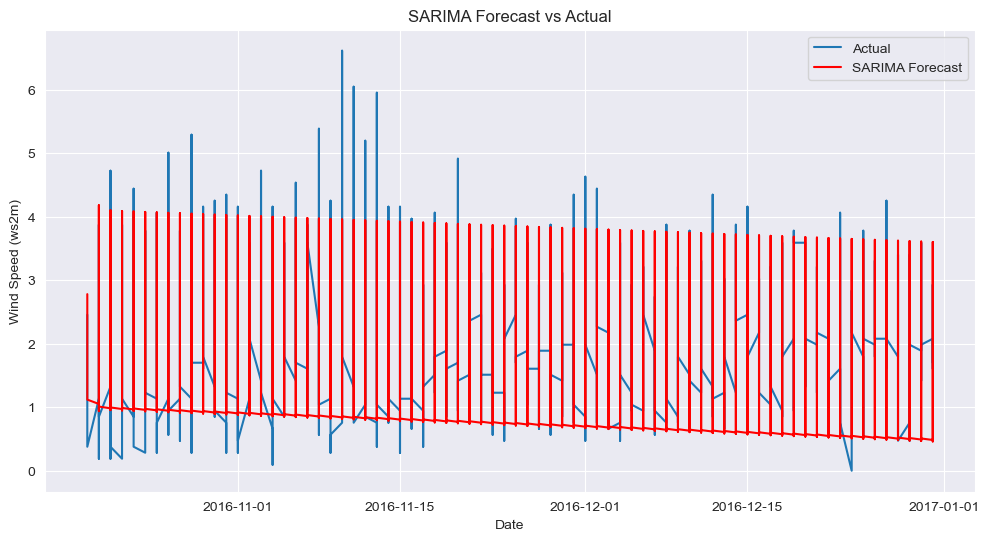

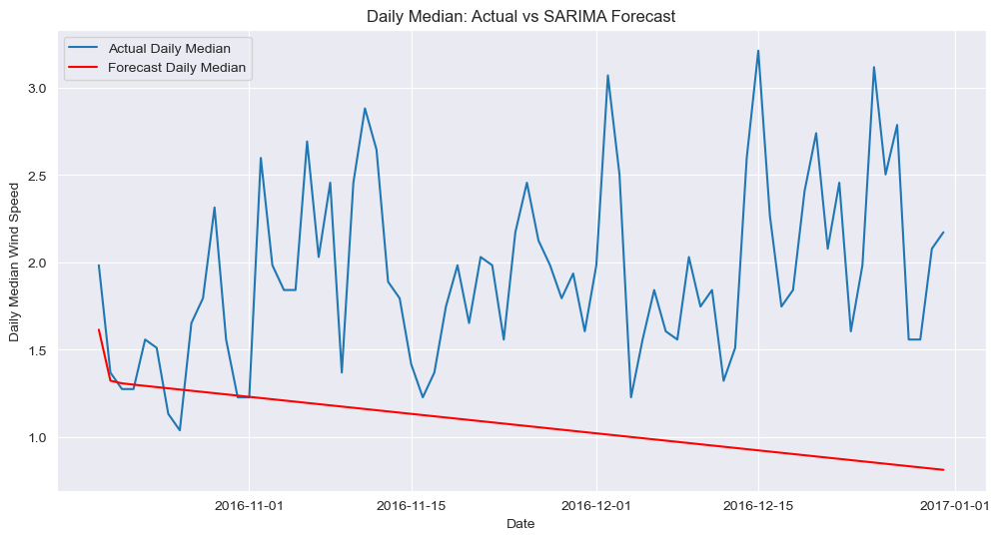

In [146]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import pandas as pd

# Example SARIMA parameters (edit these as needed)
order = (2, 1, 2)               # (p,d,q)
seasonal_order = (1, 1, 1, 24)  # (P,D,Q,s) with s=24 for hourly seasonality

# Fit SARIMA model
sarima_model = SARIMAX(train['ws2m'], order=order, seasonal_order=seasonal_order)
sarima_model_fit = sarima_model.fit()

# Make predictions
sarima_pred = sarima_model_fit.get_forecast(steps=len(test))
sarima_pred_series = sarima_pred.predicted_mean
sarima_pred_series.index = test.index  # Align with test index

# Create comparison DataFrame
combined_df = pd.DataFrame({
    'Actual': test['ws2m'],
    'Forecast': sarima_pred_series
})

# Calculate error
error = mean_squared_error(test['ws2m'], sarima_pred_series)
print('Test MSE: %.3f' % error)

# Hourly plot
plt.figure(figsize=(12,6))
plt.plot(combined_df.index, combined_df['Actual'], label='Actual')
plt.plot(combined_df.index, combined_df['Forecast'], color='red', label='SARIMA Forecast')
plt.xlabel('Date')
plt.ylabel('Wind Speed (ws2m)')
plt.title('SARIMA Forecast vs Actual')
plt.legend()
plt.show()

# Daily median comparison
daily_median = combined_df.resample('D').median()

plt.figure(figsize=(12,6))
plt.plot(daily_median.index, daily_median['Actual'], label='Actual Daily Median')
plt.plot(daily_median.index, daily_median['Forecast'], label='Forecast Daily Median', color='red')
plt.xlabel('Date')
plt.ylabel('Daily Median Wind Speed')
plt.title('Daily Median: Actual vs SARIMA Forecast')
plt.legend()
plt.show()


In [148]:
# may be non stationality 

In [152]:
combined_train['ws2m']

date
2016-01-01   1.984
2016-01-01   1.606
2016-01-01   1.417
2016-01-01   1.984
2016-01-01   1.795
              ... 
2016-12-28   3.401
2016-12-28   3.401
2016-12-28   3.023
2016-12-28   2.740
2016-12-28   2.079
Name: ws2m, Length: 8707, dtype: float64

In [154]:
print("NaN values in 'Actual':", combined_df['Actual'].isna().sum())
print("NaN values in 'Forecast':", combined_df['Forecast'].isna().sum())


NaN values in 'Actual': 0
NaN values in 'Forecast': 1757


In [156]:
print(sarima_model_fit.summary())


                                      SARIMAX Results                                      
Dep. Variable:                                ws2m   No. Observations:                 8707
Model:             SARIMAX(2, 2, 1)x(1, 1, [], 24)   Log Likelihood               -8147.343
Date:                             Wed, 14 May 2025   AIC                          16304.685
Time:                                     14:28:12   BIC                          16340.030
Sample:                                          0   HQIC                         16316.734
                                            - 8707                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0197      0.009      2.319      0.020       0.003       0.036
ar.L2         -0.1527      

Optimization terminated successfully.
         Current function value: 1.141648
         Iterations: 3
         Function evaluations: 239
            Actual  Forecast
2016-12-27   2.079     0.866
2016-12-28   1.795     0.875
2016-12-29   0.756     0.776
2016-12-30   1.890     0.573
2016-12-31   2.079     0.699


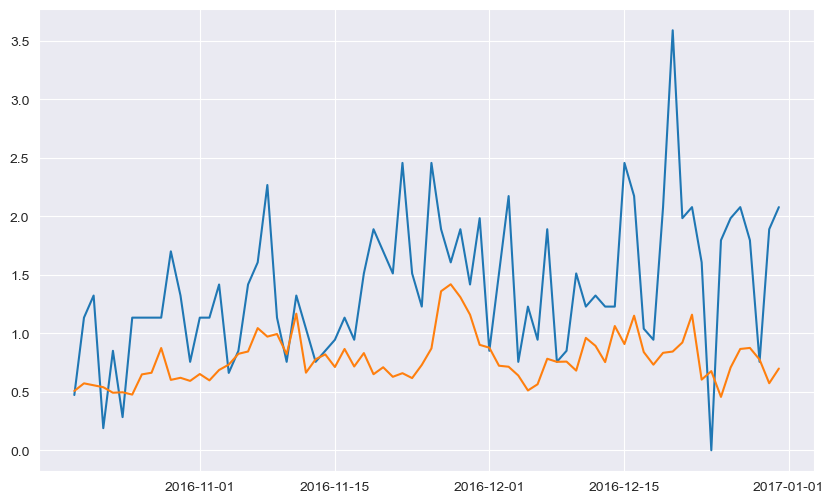

In [220]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import numpy as np

# 1. Simplified Parameters (No Seasonality)
order = (4, 1, 0)
seasonal_order = (0, 0, 0, 0)  # Disabled seasonality

# 2. Stabilized Model Configuration
sarima_model = SARIMAX(train['ws2m'],
                      exog=train[['t2', 'rh2']],
                      order=order,
                      seasonal_order=seasonal_order,
                      enforce_stationarity=True,
                      enforce_invertibility=True)

# 3. Robust Fitting
sarima_fit = sarima_model.fit(disp=True, maxiter=200, method='powell')

# 4. Forecast with Validation
try:
    forecast = sarima_fit.get_forecast(
        steps=len(test),
        exog=test[['t2', 'rh2']]
    )
    forecast_series = forecast.predicted_mean
except Exception as e:
    print(f"Forecast failed: {str(e)}")
    forecast_series = pd.Series(np.zeros(len(test)), index=test.index)

# 5. Result Handling
combined_df = pd.DataFrame({
    'Actual': test['ws2m'],
    'Forecast': forecast_series
}).dropna()

if not combined_df.empty:
    print(combined_df.tail())
    plt.plot(combined_df['Actual'], label='Actual')
    plt.plot(combined_df['Forecast'], label='Forecast')
    plt.show()
else:
    print("No valid forecasts generated")


In [222]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

mse = mean_squared_error(combined_df['Actual'], combined_df['Forecast'])
rmse = np.sqrt(mse)
mae = mean_absolute_error(combined_df['Actual'], combined_df['Forecast'])
mape = np.mean(np.abs((combined_df['Actual'] - combined_df['Forecast']) / combined_df['Actual'])) * 100

print(f"MSE: {mse:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"MAE: {mae:.3f}")
print(f"MAPE: {mape:.2f}%")


MSE: 0.694
RMSE: 0.833
MAE: 0.650
MAPE: inf%


In [194]:
# Check for duplicate indices in test data
print("Duplicate indices in test:", test.index.duplicated().sum())



Duplicate indices in test: 0


In [168]:
print("Duplicate indices in test:", test.index.duplicated().sum())


Duplicate indices in test: 1683


In [170]:
test

,t2,rh2,ws2m,wd3m,Actual_Smooth
date,,,,,
2016-10-19,29.800,92.600,2.457,304.000,3.408
2016-10-19,29.400,95.500,1.984,333.000,3.052
2016-10-19,29.100,97.100,1.984,357.000,2.785
2016-10-19,28.500,98.100,0.472,24.000,2.207
2016-10-19,28.300,99.000,0.378,230.000,1.750
...,...,...,...,...,...
2016-12-31,24.000,80.100,2.173,313.000,2.492
2016-12-31,23.900,81.700,2.173,316.000,2.413
2016-12-31,23.900,83.300,1.890,321.000,2.282


In [172]:
# Resample to handle duplicates properly
test_clean = test.resample('H').mean().ffill()  # Hourly resample

# Now split data correctly
train_size = int(len(df1) * 0.8)
train = df1.iloc[:train_size].resample('H').mean().ffill()
test = df1.iloc[train_size:].resample('H').mean().ffill()

print("Cleaned train shape:", train.shape)
print("Cleaned test shape:", test.shape)


Cleaned train shape: (7009, 5)
Cleaned test shape: (1753, 5)


In [238]:
train

,t2,rh2,ws2m,wd3m,Actual_Smooth
date,,,,,
2016-01-01,19.600,69.600,1.984,37.000,1.984
2016-01-02,20.300,74.000,2.645,37.000,2.737
2016-01-03,20.200,61.400,2.362,24.000,3.366
2016-01-04,22.900,59.000,4.252,1.000,4.400
2016-01-05,23.400,73.100,1.512,317.000,1.826
...,...,...,...,...,...
2016-10-14,27.200,100.000,0.756,78.000,1.491
2016-10-15,28.000,100.000,0.945,43.000,1.624
2016-10-16,27.600,100.000,0.850,190.000,1.388


In [240]:
train.head()

,t2,rh2,ws2m,wd3m,Actual_Smooth
date,,,,,
2016-01-01,19.600,69.600,1.984,37.000,1.984
2016-01-02,20.300,74.000,2.645,37.000,2.737
2016-01-03,20.200,61.400,2.362,24.000,3.366
2016-01-04,22.900,59.000,4.252,1.000,4.400
2016-01-05,23.400,73.100,1.512,317.000,1.826


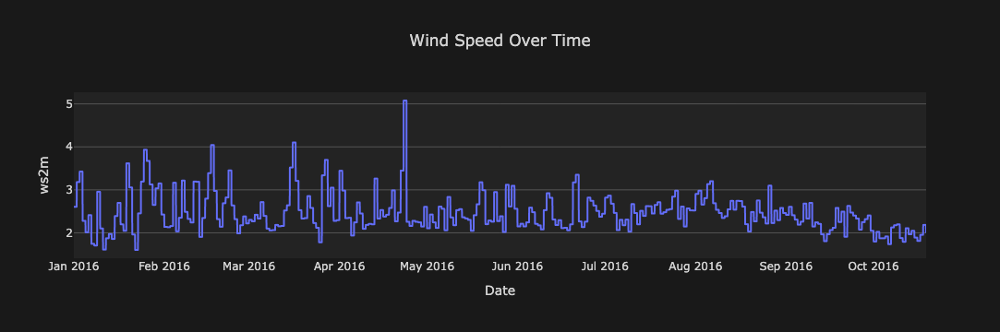

In [182]:
fig_wind_speed = px.line(train, x=train.index, y='ws2m', title='Wind Speed Over Time')
fig_wind_speed.update_layout(template='xgridoff_dark', title_x=0.5, xaxis_title="Date")
fig_wind_speed.show()

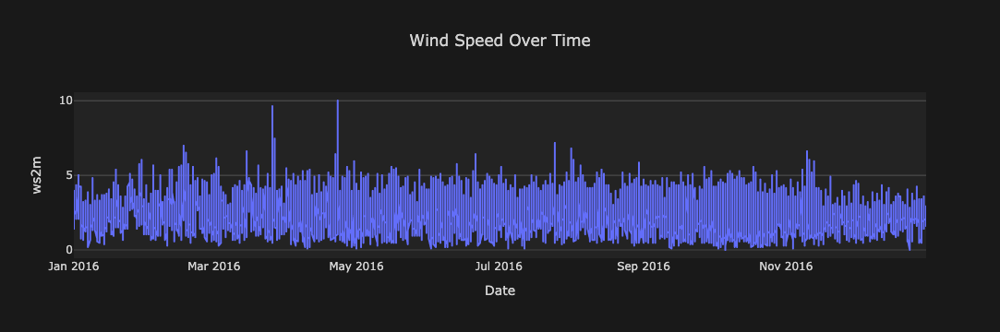

In [184]:
fig_wind_speed = px.line(df, x=df.index, y='ws2m', title='Wind Speed Over Time')
fig_wind_speed.update_layout(template='xgridoff_dark', title_x=0.5, xaxis_title="Date")
fig_wind_speed.show()

In [188]:
# Instead of resampling, keep first occurrence of each timestamp
df1_clean = df1.loc[~df1.index.duplicated(keep='first')]


In [242]:
######

In [244]:
######

In [246]:
######

In [248]:
##### Doing again ARIMA AND SARIMA ##########
